In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import cm

In [2]:
df= pd.read_csv('BasicCompanyDataAsOneFile-2021-11-01.csv')

/Users/xiawang/opt/anaconda3/envs/data_visualization/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3444: DtypeWarning: Columns (41,42,43,44,45,46,47,48,49,50,51,52) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


# Graph 2 processing

In [7]:
# make a copy of the original datasets
df_ = df.copy()

# force the dates which are outside the bounds to NaT, limitation(1677-2262) and drop them
df_['IncorporationDate'] = pd.to_datetime(df_['IncorporationDate'], errors = 'coerce')
df_.dropna(subset = ['IncorporationDate'], inplace=True)
# convert the incorporation data into datetime format
df_[['DissolutionDate','IncorporationDate']] = df_[['DissolutionDate','IncorporationDate']].apply(lambda x: pd.to_datetime(x,format='%d/%m/%Y'))

# drop the rows with missing SICCode_1
df_.dropna(subset = ['SICCode.SicText_1'], inplace=True)
# drop the rows with SICCode_1 ==99999
df_.drop(df_[df_["SICCode.SicText_1"] == "99999 - Dormant Company"].index, inplace=True)
# drop the rows with SICCode_1 == None Supplied
df_.drop(df_[df_["SICCode.SicText_1"] == "None Supplied"].index, inplace=True)

# drop the rows with only 4 SICCode_1
drop = df_['SICCode.SicText_1'].apply(lambda x:False if len(x.split(" ")[0])==4 else True)
df_['drop'] = drop
df_.drop(df_.loc[df_['SICCode.SicText_1']== False].index, inplace=True)

# get first 2 numbers of SIC codes of all the companies
df_.loc[:, "SIC1"] = df_["SICCode.SicText_1"].str[0:2]
df_.loc[:, "SIC2"] = df_["SICCode.SicText_2"].str[0:2]
df_.loc[:, "SIC3"] = df_["SICCode.SicText_3"].str[0:2]
df_.loc[:, "SIC4"] = df_["SICCode.SicText_4"].str[0:2]

# Count the number of SICs the companies have
df_["SICCounts"] = df_[["SICCode.SicText_1", "SICCode.SicText_2",
                         "SICCode.SicText_3", "SICCode.SicText_4"]].notnull().sum(axis=1)

# Group the SICCode1 into different sectors
df_.loc[(df_['SIC1'] >= '1') & (df_['SIC1'] < '4') , 'Sector'] = 'Agriculture, Forestry and Fishing'
df_.loc[(df_['SIC1'] >= '4') & (df_['SIC1'] < '10') , 'Sector'] = 'Mining and Quarrying'
df_.loc[(df_['SIC1'] >= '10') & (df_['SIC1'] < '34') , 'Sector'] = 'Manufacturing'
df_.loc[(df_['SIC1'] >= '34') & (df_['SIC1'] < '36') , 'Sector'] = 'Electricity, gas, steam and air conditioning supply'
df_.loc[(df_['SIC1'] >= '36') & (df_['SIC1'] < '40') , 'Sector'] = 'Water supply, sewerage, waste management and remediation activities'
df_.loc[(df_['SIC1'] >= '40') & (df_['SIC1'] < '44') , 'Sector'] = 'Construction'
df_.loc[(df_['SIC1'] >= '44') & (df_['SIC1'] < '48') , 'Sector'] = 'Wholesale and retail trade; repair of motor vehicles and motorcycles'
df_.loc[(df_['SIC1'] >= '48') & (df_['SIC1'] < '54') , 'Sector'] = 'Transportation and storage'
df_.loc[(df_['SIC1'] >= '54') & (df_['SIC1'] < '57') , 'Sector'] = 'Accommodation and food service activities'
df_.loc[(df_['SIC1'] >= '57') & (df_['SIC1'] < '63') , 'Sector'] = 'Information and communication'
df_.loc[(df_['SIC1'] >= '63') & (df_['SIC1'] < '67') , 'Sector'] = 'Financial and insurance activities'
df_.loc[(df_['SIC1'] >= '67') & (df_['SIC1'] < '69') , 'Sector'] = 'Real estate activities'
df_.loc[(df_['SIC1'] >= '69') & (df_['SIC1'] < '76') , 'Sector'] = 'Professional, scientific and technical activities'
df_.loc[(df_['SIC1'] >= '76') & (df_['SIC1'] < '83') , 'Sector'] = 'Administrative and support service activities'
df_.loc[(df_['SIC1'] >= '83') & (df_['SIC1'] < '85') , 'Sector'] = 'Public administration and defence; compulsory social security'
df_.loc[(df_['SIC1'] >= '85') & (df_['SIC1'] < '86') , 'Sector'] = 'Education'
df_.loc[(df_['SIC1'] >= '86') & (df_['SIC1'] < '89') , 'Sector'] = 'Human health and social work activities'
df_.loc[(df_['SIC1'] >= '89') & (df_['SIC1'] < '94') , 'Sector'] = 'Arts, entertainment and recreation'
df_.loc[(df_['SIC1'] >= '94') & (df_['SIC1'] < '97') , 'Sector'] = 'Other service activities'
df_.loc[(df_['SIC1'] >= '97') & (df_['SIC1'] < '99') , 'Sector'] = 'Activities of households as employers'
df_.loc[(df_['SIC1'] >= '99')] = 'Activities of extraterritorial organisations and bodies'
df_['IncorporationDate'] = pd.to_datetime(df_['IncorporationDate'], errors = 'coerce')

In [8]:
# select the specific period of data we want: before and after COVID by quarter
df_quarter= df_[(df_['IncorporationDate'] >= "2018-06-01") & (df_['IncorporationDate'] < "2021-12-01")]
df_quarter['quarter'] = df_quarter['IncorporationDate'].dt.to_period('Q')
df_quarter= df_quarter.groupby(['quarter']).count()
df_quarter.reset_index(inplace=True)
df_quarter['quarter']= df_quarter['quarter'].dt.strftime('Q%q_%Y')

/var/folders/ck/0nyny8717t5czn1604zh9l2c0000gn/T/ipykernel_75415/164929099.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_quarter['quarter'] = df_quarter['IncorporationDate'].dt.to_period('Q')


In [9]:
# group the same period of time by sectors
df_sector= df_[(df_['IncorporationDate'] >= "2018-06-01") & (df_['IncorporationDate'] < "2021-12-01")]
df_sector['quarter'] = df_sector['IncorporationDate'].dt.to_period('Q')
df_sector= df_sector.groupby(['quarter','Sector']).count()
df_sector.reset_index(inplace=True)
df_sector['quarter']= df_sector['quarter'].dt.strftime('Q%q_%Y')

/var/folders/ck/0nyny8717t5czn1604zh9l2c0000gn/T/ipykernel_75415/3887479789.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sector['quarter'] = df_sector['IncorporationDate'].dt.to_period('Q')


In [10]:
# select the sectors that we are interested
df_retail= df_sector[(df_sector['Sector'] == 'Wholesale and retail trade; repair of motor vehicles and motorcycles')]
df_prof= df_sector[(df_sector['Sector'] == 'Professional, scientific and technical activities')]
df_inf= df_sector[(df_sector['Sector'] == 'Information and communication')]
df_real= df_sector[(df_sector['Sector'] == 'Real estate activities')]
df_acc= df_sector[(df_sector['Sector'] == 'Accommodation and food service activities')]
df_edu= df_sector[(df_sector['Sector'] == 'Education')]


In [11]:
# Dataframe of Pie charts of before and after COVID
pie_before= df_[(df_['IncorporationDate'] >= "2018-06-01") & (df_['IncorporationDate'] < "2020-03-01")]
pie_after = df_[(df_['IncorporationDate'] >= "2020-03-01") & (df_['IncorporationDate'] < "2021-12-01")]

pie_before = pie_before.groupby('Sector').count()
pie_before.reset_index(inplace=True)
pie_after = pie_after.groupby('Sector').count()
pie_after.reset_index(inplace=True)

## Plot 2

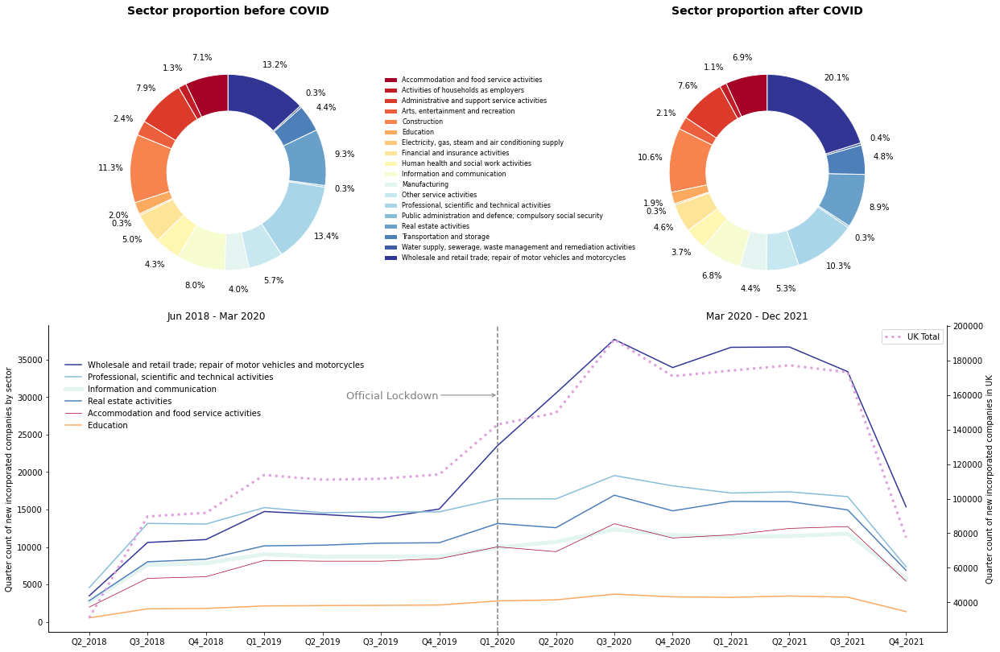

In [12]:
from matplotlib import gridspec

fig = plt.figure(figsize=(20,14))
spec = gridspec.GridSpec(ncols=2, nrows=2,
                         height_ratios=[1, 1],
                         width_ratios=[0.75,0.75])


ax0 = fig.add_subplot(spec[0,0]) # left pie
ax2 = fig.add_subplot(spec[0,1]) # right pie
ax1 = fig.add_subplot(spec[1,:]) # big timeline
# ax3 = fig.add_subplot(spec[1,0]) # small timeline



colormap = plt.cm.RdYlBu   
colors = [colormap(i*15) for i in range(0,19)]
# colors2 = [colormap(i*17) for i in range(0,19)]

# label_= list(df_sub['Sector'].unique())
wedgeprops = {'width':0.3, 'edgecolor':'white'}

#plot ax1: big timeline
ax1.plot(df_retail['quarter'], df_retail['CompanyName'], 
        color =[0.19215686274509805, 0.21176470588235294, 0.5843137254901961, 1.0], 
        label= 'Wholesale and retail trade; repair of motor vehicles and motorcycles')
ax1.plot(df_prof['quarter'], df_prof['CompanyName'], 
        color =[0.5310265282583623, 0.7393310265282584, 0.8528258362168397, 1.0], 
        label= 'Professional, scientific and technical activities')
ax1.plot(df_inf['quarter'], df_inf['CompanyName'], 
        color =[0.892733564013841, 0.9584775086505191, 0.9462514417531716, 1.0], linewidth=5, 
        label='Information and communication')
ax1.plot(df_real['quarter'], df_real['CompanyName'], 
        color =[0.30311418685121105, 0.49757785467128024, 0.7259515570934256, 1.0], 
        label= 'Real estate activities')
ax1.plot(df_acc['quarter'], df_acc['CompanyName'], 
        color =[0.6470588235294118, 0.0, 0.14901960784313725, 1.0], linewidth=0.7,
        label= 'Accommodation and food service activities')
ax1.plot(df_edu['quarter'], df_edu['CompanyName'], 
        color =[0.990080738177624, 0.6673587081891579, 0.37347174163783153, 1.0], label='Education')

ax3  = ax1.twinx()
ax3.plot(df_quarter['quarter'], df_quarter['CompanyName'],color='plum', linestyle=':', label='UK Total', linewidth=3)

    
# plot ax0 and ax2: pie charts
ax0.pie(pie_before['CompanyName'], autopct='%1.1f%%', colors=colors, startangle=90, radius=0.8, wedgeprops=wedgeprops, 
        pctdistance = 1.2)
ax2.pie(pie_after['CompanyName'], autopct='%1.1f%%', colors=colors, startangle=90, radius=0.8, wedgeprops=wedgeprops, 
        pctdistance = 1.2)



# ax0 settings: left pie
ax0.text(-0.5, -1.2, 'Jun 2018 - Mar 2020', fontsize=12)
# ax0.text(-0.6,1.3, 'Sector proportion before COVID', fontsize=14, fontweight='semibold')
ax0.legend(pie_before['Sector'],loc= (1,0.2), fontsize=8, frameon=False)
ax0.set_title('Sector proportion before COVID', fontsize=14, fontweight='semibold')


#ax 2 settings : right pie
ax2.text(-0.5, -1.2, 'Mar 2020 - Dec 2021', fontsize=12)
ax2.set_title('Sector proportion after COVID', fontsize=14, fontweight='semibold')


# ax1 settings: big timeline
ax1.spines[['right','top']].set_visible(False)
ax1.axvline('Q1_2020', color='grey', linestyle='--')
ax1.spines[['right','top']].set_visible(False)
ax1.set_ylabel('Quarter count of new incorporated companies by sector')
ax1.legend(loc=(0.015,0.65), frameon=False)


# ax3 settings:
ax3.spines[['top']].set_visible(False)
ax3.set_ylabel('Quarter count of new incorporated companies in UK')
ax3.legend(loc='upper right')
ax3.annotate('Official Lockdown', xy=(4.4, 158000), fontsize=13, color='grey')
ax3.annotate(
    '', xy=(6, 160000), xycoords='data',
    xytext=(7, 160000), textcoords='data',
    arrowprops={'arrowstyle': '<-','color':'grey'})

plt.subplots_adjust(wspace=0.5, 
                    hspace=0)
                
# plt.title('Sector proportion before vs after COVID', fontsize=12, fontweight='semibold')
# ax1.spines[['right','top','left']].set_visible(False)
# ax1.yaxis.set_label_position("right")
# ax1.yaxis.tick_right()
# ax1.set_xticklabel(after_df['quarter'], rotation =40, ha='right')

plt.show()

# Graph 1 processing 

In [13]:
# copy of the original datasets
df_ = df.copy()
#force the dates which are outside the bounds to NaT, limitation(1677-2262)
# convert the incorporation data into datetime format
df_['IncorporationDate'] = pd.to_datetime(df_['IncorporationDate'], errors = 'coerce')
df_.dropna(subset = ['IncorporationDate'], inplace=True)

df_[['DissolutionDate','IncorporationDate']] = df_[['DissolutionDate','IncorporationDate']].apply(lambda x: pd.to_datetime(x,format='%d/%m/%Y'))

# drop the rows with missing SICCode_1
df_.dropna(subset = ['SICCode.SicText_1'], inplace=True)
# drop the rows with SICCode_1 ==99999
df_.drop(df_[df_["SICCode.SicText_1"] == "99999 - Dormant Company"].index, inplace=True)
# ## 3.3 drop the rows with SICCode_1 == None Supplied
df_.drop(df_[df_["SICCode.SicText_1"] == "None Supplied"].index, inplace=True)


# get first 2 number of SIC codes of all the companies
df_.loc[:, "SIC1"] = df_["SICCode.SicText_1"].str[0:2]
df_.loc[:, "SIC2"] = df_["SICCode.SicText_2"].str[0:2]
df_.loc[:, "SIC3"] = df_["SICCode.SicText_3"].str[0:2]
df_.loc[:, "SIC4"] = df_["SICCode.SicText_4"].str[0:2]

temp = df_["SICCode.SicText_1"].apply(lambda x:False if len(x.split(" ")[0])==4 else True)


# Count the number of SICs the companies have
df_["SICCounts"] = df_[["SICCode.SicText_1", "SICCode.SicText_2",
                         "SICCode.SicText_3", "SICCode.SicText_4"]].notnull().sum(axis=1)



df_['RegAddress.PostTown'] =df_['RegAddress.PostTown'].apply(lambda x: "OTHER" if x!= 'LONDON' else x ) 
df_ =  df_[(df_['IncorporationDate'] >= "2020-03-01") & (df_['IncorporationDate'] < "2021-12-01")]
df_['IncorporationDate'] = pd.to_datetime(df_['IncorporationDate'], errors = 'coerce')

In [14]:

# df_['RegAddress.PostTown'] =df_['RegAddress.PostTown'].apply(lambda x: "OTHER" if x!= 'LONDON' else x ) 

# columns = df_[['IncorporationDate', 'RegAddress.PostTown','SIC1', 'CompanyName']]
# df_loc =  columns[(columns['IncorporationDate'] >= "2020-03-01") & (columns['IncorporationDate'] < "2021-12-01")]

df_['month_year'] = df_['IncorporationDate'].dt.to_period('M')
df_ = df_.groupby(['month_year','RegAddress.PostTown']).count()
# df_loc['IncorporationDate'].dt.strftime('%B-%Y')

df_.reset_index(inplace=True)

In [15]:
df_london = df_[df_["RegAddress.PostTown"] == 'LONDON']
df_other = df_[df_["RegAddress.PostTown"] == 'OTHER']
df_other.reset_index()

df_london['month_year'] = df_london['month_year'].dt.strftime('%Y-%m')
df_other['month_year'] = df_other['month_year'].dt.strftime('%Y-%m')

df_london.set_index('month_year')

/var/folders/ck/0nyny8717t5czn1604zh9l2c0000gn/T/ipykernel_75415/3067482902.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_london['month_year'] = df_london['month_year'].dt.strftime('%Y-%m')
/var/folders/ck/0nyny8717t5czn1604zh9l2c0000gn/T/ipykernel_75415/3067482902.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_other['month_year'] = df_other['month_year'].dt.strftime('%Y-%m')


,RegAddress.PostTown,CompanyName,CompanyNumber,RegAddress.CareOf,RegAddress.POBox,RegAddress.AddressLine1,RegAddress.AddressLine2,RegAddress.County,RegAddress.Country,RegAddress.PostCode,...,PreviousName_9.CompanyName,PreviousName_10.CONDATE,PreviousName_10.CompanyName,ConfStmtNextDueDate,ConfStmtLastMadeUpDate,SIC1,SIC2,SIC3,SIC4,SICCounts
month_year,,,,,,,,,,,,,,,,,,,,,
2020-03,LONDON,10094,10094,0,10,10094,4597,1014,9935,10091,...,1,1,1,10094,7430,10094,2813,1478,844,10094
2020-04,LONDON,10431,10431,0,13,10430,4735,1023,10288,10425,...,0,0,0,10431,7647,10431,2918,1519,819,10431
2020-05,LONDON,10804,10804,0,13,10804,4920,1175,10657,10801,...,0,0,0,10804,8638,10804,3093,1588,830,10804
2020-06,LONDON,14901,14901,0,21,14901,6429,1494,14722,14898,...,0,0,0,14901,9473,14901,4228,2176,1188,14901
2020-07,LONDON,16647,16647,0,25,16647,7214,1531,16468,16644,...,0,0,0,16647,10738,16647,4628,2444,1360,16647
2020-08,LONDON,14032,14032,0,25,14032,6091,1315,13908,14024,...,0,0,0,14032,8533,14032,3822,1991,1075,14032
2020-09,LONDON,16009,16009,0,18,16009,6924,1668,15876,16002,...,0,0,0,16009,8251,16009,4424,2269,1184,16009
2020-10,LONDON,16339,16339,0,18,16339,7184,1891,16182,16338,...,0,0,0,16339,6340,16339,4623,2525,1363,16339
2020-11,LONDON,15126,15126,0,22,15126,6553,1992,14982,15117,...,0,0,0,15126,3676,15126,4216,2237,1227,15126


## Covid dataset

In [20]:
# read the covid dataset
df_covid = pd.read_csv('data_2021-Dec-08.csv')

# data processing
df_covid['date'] = pd.to_datetime(df_covid['date'], errors = 'coerce')
df_covid = df_covid.sort_values(by='date',ascending=True).groupby('date').sum()

# # group covid data by month from March 2020 to November of 2021
df_covid.reset_index(inplace=True)
# df_covid.reset_index(inplace=True)

# # select the time period when the covid start: March 2020
df_covid = df_covid[(df_covid['date'] >= "2020-03-01") & (df_covid['date'] < "2021-12-01")]
df_covid['date'] = df_covid['date'].dt.to_period('M')
df_covid = df_covid.groupby('date').sum()
df_covid.reset_index(inplace=True)
df_covid['date'] = df_covid['date'].dt.strftime('%Y-%m')

# df_ = df_.groupby(['month_year','RegAddress.PostTown']).count()
# df_covid['date'] = df_covid.index
# # df_covid['date_str'] = df_covid['date_str'].astype(str)

# Plot 1

/var/folders/ck/0nyny8717t5czn1604zh9l2c0000gn/T/ipykernel_75415/1002731684.py:66: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_yticklabels([int(abs(tick)) for tick in ticks])


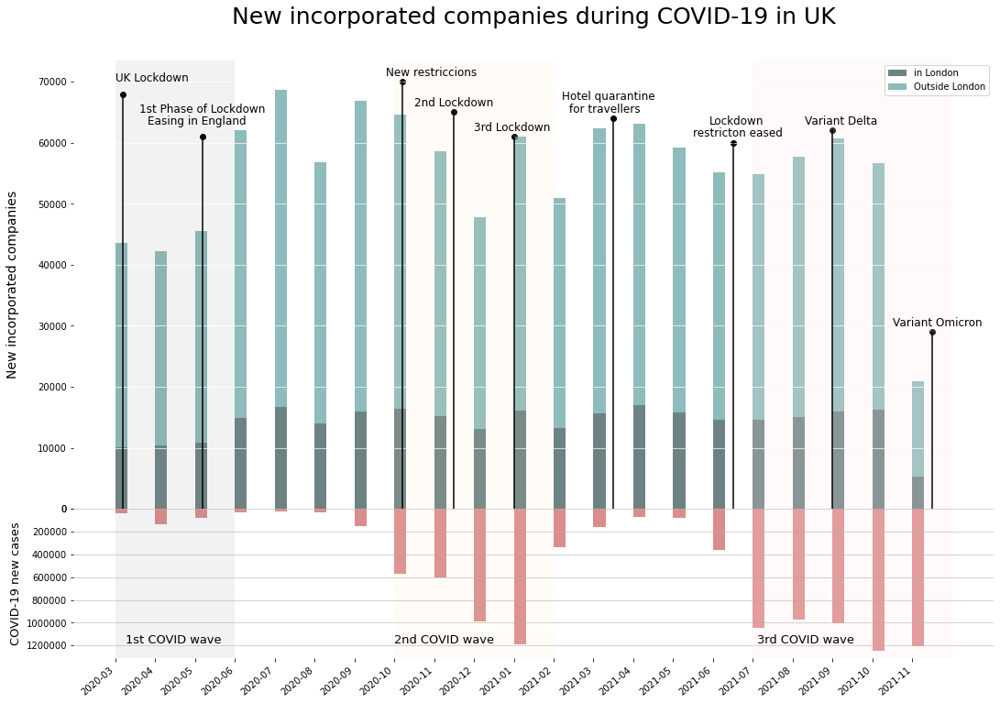

In [21]:
from matplotlib import gridspec
# First plot
fig = plt.figure(figsize=(18,12))

spec = gridspec.GridSpec(ncols=1, nrows=2,
                        height_ratios=[3, 1])


ax0 = fig.add_subplot(spec[0])
ax1 = fig.add_subplot(spec[1])

x= df_london['month_year']
y1=  df_london['CompanyName']
y2= df_other['CompanyName']

# scatter plot 
pos=[0.2, 2.2,7.2,8.5,10,12.5,20.5,18,15.5]
counts=[68000, 61000,70000, 65000, 61000, 64000, 29000, 62000,60000]
for i,j in zip(pos,counts):
    ax0.vlines(x=i, ymin=0, ymax=j, color='k')


# plot the subplots
ax0.bar(x, y1,color='darkslategray', alpha=0.7, align='edge', width=0.3, label='in London')
ax0.bar(x, y2, bottom=y1, color='cadetblue', alpha=0.7,align='edge', width=0.3, label='Outside London')
ax0.scatter(pos, counts, color='black')
ax1.bar(df_covid['date'],-df_covid['newCasesBySpecimenDate'], color='indianred', align='edge', alpha=0.7, width=0.3)



# ax0 settings
ax0.spines[['right','bottom','top', 'left']].set_visible(False)
ax0.xaxis.set_visible(False)
ax0.set_ylabel('New incorporated companies', labelpad=20, fontsize=14)
ax0.grid(axis='y', linestyle='-', alpha=0.7, color='white', linewidth=1)
ax0.set_title('New incorporated companies during COVID-19 in UK', fontsize=25, pad=40)
ax0.axvspan('2020-03', '2020-06', facecolor='grey', alpha=0.1)
ax0.axvspan('2020-10', '2021-02', facecolor='moccasin', alpha=0.1)
ax0.axvspan('2021-07', '2021-12', facecolor='mistyrose', alpha=0.2)
ax0.legend(loc = 'upper right')

ax0.annotate('UK Lockdown', xy=(0, 70000), fontsize=12)
ax0.annotate('1st Phase of Lockdown', xy=(0.6, 65000), fontsize=12)
ax0.annotate('Easing in England', xy=(0.8, 63000), fontsize=12)
ax0.annotate('New restriccions', xy=(6.8, 71000), fontsize=12)
ax0.annotate('2nd Lockdown', xy=(7.5, 66000), fontsize=12)
ax0.annotate('3rd Lockdown', xy=(9, 62000), fontsize=12)
ax0.annotate('Hotel quarantine', xy=(11.2, 67000), fontsize=12)
ax0.annotate('for travellers', xy=(11.4, 65000), fontsize=12)
ax0.annotate('Variant Omicron', xy=(19.5, 30000), fontsize=12)
ax0.annotate('Variant Delta', xy=(17.3, 63000), fontsize=12)
ax0.annotate('Lockdown', xy=(14.9, 63000), fontsize=12)
ax0.annotate('restricton eased', xy=(14.5, 61000), fontsize=12)

#ax1 settings
ax1.spines[['top','right', 'bottom','left']].set_visible(False)
ax1.set_ylabel('COVID-19 new cases', fontsize=13)
ax1.set_xticks(df_covid['date'])
ax1.set_xticklabels(df_covid['date'], rotation=40, ha='right')
ax1.grid(axis='y', linestyle='-', alpha=0.7)
# ax1.yaxis.set_label_position("right")
# ax1.yaxis.tick_right()

# set labels to absolute values and with integer representation
ticks =  ax1.get_yticks()
ax1.set_yticklabels([int(abs(tick)) for tick in ticks])

# remove the space between subplots
plt.subplots_adjust(wspace=0, 
                    hspace=0)

# shade the covid peak area
ax1.axvspan('2020-03', '2020-06', facecolor='grey', alpha=0.1, label='1st COVID wave')
ax1.axvspan('2020-10', '2021-02', facecolor='moccasin', alpha=0.1, label='2nd COVID wave')
ax1.axvspan('2021-07', '2021-12', facecolor='mistyrose',alpha=0.2, label='3rd COVID wave')
ax1.annotate('1st COVID wave', xy=(0.25, -1178000), fontsize=13)
ax1.annotate('2nd COVID wave', xy=(7, -1178000), fontsize=13)
ax1.annotate('3rd COVID wave', xy=(16.1, -1178000), fontsize=13)




plt.show()

# Graph 3 preprocessing

In [22]:
import plotly.express as px

In [23]:
# copy of the original datasets
df_ = df.copy()
#force the dates which are outside the bounds to NaT, limitation(1677-2262)
# convert the incorporation data into datetime format
df_['IncorporationDate'] = pd.to_datetime(df_['IncorporationDate'], errors = 'coerce')
df_.dropna(subset = ['IncorporationDate'], inplace=True)

df_[['DissolutionDate','IncorporationDate']] = df_[['DissolutionDate','IncorporationDate']].apply(lambda x: pd.to_datetime(x,format='%d/%m/%Y'))


drop = df_['SICCode.SicText_1'].apply(lambda x:False if len(x.split(" ")[0])==4 else True)
df_['drop'] = drop
df_.drop(df_.loc[df_['SICCode.SicText_1']== False].index, inplace=True)

# drop the rows with missing SICCode_1
df_.dropna(subset = ['SICCode.SicText_1'], inplace=True)
# drop the rows with SICCode_1 ==99999
df_.drop(df_[df_["SICCode.SicText_1"] == "99999 - Dormant Company"].index, inplace=True)
# ## 3.3 drop the rows with SICCode_1 == None Supplied
df_.drop(df_[df_["SICCode.SicText_1"] == "None Supplied"].index, inplace=True)


# get first 2 number of SIC codes of all the companies
df_.loc[:, "SIC1"] = df_["SICCode.SicText_1"].str[0:2]
df_.loc[:, "SIC2"] = df_["SICCode.SicText_2"].str[0:2]
df_.loc[:, "SIC3"] = df_["SICCode.SicText_3"].str[0:2]
df_.loc[:, "SIC4"] = df_["SICCode.SicText_4"].str[0:2]


# Count the number of SICs the companies have
df_["SICCounts"] = df_[["SICCode.SicText_1", "SICCode.SicText_2",
                         "SICCode.SicText_3", "SICCode.SicText_4"]].notnull().sum(axis=1)

                         

df_.loc[(df_['SIC1'] >= '1') & (df_['SIC1'] < '4') , 'Sector'] = 'Agriculture, Forestry and Fishing'
df_.loc[(df_['SIC1'] >= '4') & (df_['SIC1'] < '10') , 'Sector'] = 'Mining and Quarrying'
df_.loc[(df_['SIC1'] >= '10') & (df_['SIC1'] < '34') , 'Sector'] = 'Manufacturing'
df_.loc[(df_['SIC1'] >= '34') & (df_['SIC1'] < '36') , 'Sector'] = 'Electricity, gas, steam and air conditioning supply'
df_.loc[(df_['SIC1'] >= '36') & (df_['SIC1'] < '40') , 'Sector'] = 'Water supply, sewerage, waste management and remediation activities'
df_.loc[(df_['SIC1'] >= '40') & (df_['SIC1'] < '44') , 'Sector'] = 'Construction'
df_.loc[(df_['SIC1'] >= '44') & (df_['SIC1'] < '48') , 'Sector'] = 'Wholesale and retail trade; repair of motor vehicles and motorcycles'
df_.loc[(df_['SIC1'] >= '48') & (df_['SIC1'] < '54') , 'Sector'] = 'Transportation and storage'
df_.loc[(df_['SIC1'] >= '54') & (df_['SIC1'] < '57') , 'Sector'] = 'Accommodation and food service activities'
df_.loc[(df_['SIC1'] >= '57') & (df_['SIC1'] < '63') , 'Sector'] = 'Information and communication'
df_.loc[(df_['SIC1'] >= '63') & (df_['SIC1'] < '67') , 'Sector'] = 'Financial and insurance activities'
df_.loc[(df_['SIC1'] >= '67') & (df_['SIC1'] < '69') , 'Sector'] = 'Real estate activities'
df_.loc[(df_['SIC1'] >= '69') & (df_['SIC1'] < '76') , 'Sector'] = 'Professional, scientific and technical activities'
df_.loc[(df_['SIC1'] >= '76') & (df_['SIC1'] < '83') , 'Sector'] = 'Administrative and support service activities'
df_.loc[(df_['SIC1'] >= '83') & (df_['SIC1'] < '85') , 'Sector'] = 'Public administration and defence; compulsory social security'
df_.loc[(df_['SIC1'] >= '85') & (df_['SIC1'] < '86') , 'Sector'] = 'Education'
df_.loc[(df_['SIC1'] >= '86') & (df_['SIC1'] < '89') , 'Sector'] = 'Human health and social work activities'
df_.loc[(df_['SIC1'] >= '89') & (df_['SIC1'] < '94') , 'Sector'] = 'Arts, entertainment and recreation'
df_.loc[(df_['SIC1'] >= '94') & (df_['SIC1'] < '97') , 'Sector'] = 'Other service activities'
df_.loc[(df_['SIC1'] >= '97') & (df_['SIC1'] < '99') , 'Sector'] = 'Activities of households as employers'
df_.loc[(df_['SIC1'] >= '99')] = 'Activities of extraterritorial organisations and bodies'

# df_['RegAddress.PostTown'] =df_['RegAddress.PostTown'].apply(lambda x: "OTHER" if x!= 'LONDON' else x ) 
df_['IncorporationDate'] = pd.to_datetime(df_['IncorporationDate'], errors = 'coerce')
df_ =  df_[(df_['IncorporationDate'] >= "2018-06-01") & (df_['IncorporationDate'] < "2021-12-01")]
df_['month_year'] = df_['IncorporationDate'].dt.to_period('M')


In [24]:
# reading the location file for geospatial graph
coords = 'Location.json'
location_df = pd.read_json(coords, convert_dates=True)

In [25]:
df_['month_year'] = df_['month_year'].dt.strftime('%Y-%m')

In [26]:
df_w= df_[(df_['Sector'] == 'Wholesale and retail trade; repair of motor vehicles and motorcycles')]

In [27]:
import datetime

df_w = df_w.merge(location_df, how='left')
df_w.sort_values(by=['month_year'], ascending=True,inplace=True)

In [28]:
df_w.loc[(df_w['SIC1'] == '45'), 'Industry'] = 'Repair of motor vehicles and motorcycles'
df_w.loc[(df_w['SIC1'] == '46'), 'Industry'] = 'Wholesale'
df_w.loc[(df_w['SIC1'] == '47'), 'Industry'] = 'Retail'

# Plot 3

For better visualization experience, it is highly recommended to open the file: plot_3.html to view the geospatial plot

In [29]:
fig = px.scatter_mapbox(df_w, lat='Latitude', lon='Longitude', color='Industry', 
zoom=3, mapbox_style='open-street-map', animation_frame='month_year', opacity=0.8, color_discrete_sequence=['orange','purple','cornflowerblue'])
fig.show()
fig.write_html("/Users/xiawang/Downloads/plot_3.html")